## Install Libraries ##
 * pip install gymnasium <br>
 * pip install matplotlib <br>
 * pip install numpy <br>

In [ ]:
! pip install gymnasium
! pip install matplotlib
! pip install numpy
! pip install optuna
! pip install optuna-dashboard

## References ##

In [22]:
import gymnasium as gym
import matplotlib.pyplot as plt
import numpy as np
from gymnasium import spaces
import time
import sys
from IPython.display import Image
import os
import glob

import matplotlib.animation as animation
from numpy import asarray

## Part - I : Define an RL Environment ##

In [23]:
'''
    - states
    - actions
    - rewards
    - terminal states
    - policy
'''
class LawnmowerGridWorld(gym.Env):
    def __init__(self, grid_size=4):
        self.grid_size = grid_size
        self.action_space = spaces.Discrete(4)  # up, down, left, right
        self.grid = np.zeros((grid_size, grid_size))

        self.rock1 = (3,2)
        self.rock2 = (2,3)

        self.battery1 = (0,0)
        self.battery2 = (0,2)

        self.agent_position = (self.grid_size-1, 0)
        self.goal_position = (0, grid_size-1)
        self.grid[self.goal_position] = 10
        
        self.grid[self.rock1] = -5
        self.grid[self.rock2] = -6
        self.grid[self.battery1] = 5
        self.grid[self.battery2] = 6  

    def reset(self):
        self.agent_position = (self.grid_size-1, 0)
        self.grid = np.zeros((self.grid_size, self.grid_size))
        self.grid[self.goal_position] = 10
        self.grid[self.rock1] = -5
        self.grid[self.rock2] = -6
        self.grid[self.battery1] = 5
        self.grid[self.battery2] = 6  
        return self.grid

    def step(self, action):
        done = False
        if action == 0:  # action - up
            if self.agent_position[0] > 0:
                self.agent_position = (self.agent_position[0]-1, self.agent_position[1])
        elif action == 1:  # action - down
            if self.agent_position[0] < self.grid_size-1:
                self.agent_position = (self.agent_position[0]+1, self.agent_position[1])
        elif action == 2:  # action - left
            if self.agent_position[1] > 0:
                self.agent_position = (self.agent_position[0], self.agent_position[1]-1)
        elif action == 3:  # action - right
            if self.agent_position[1] < self.grid_size-1:
                self.agent_position = (self.agent_position[0], self.agent_position[1]+1)

        if self.agent_position == self.goal_position:
            done = True
        reward = self.grid[(self.agent_position[0],self.agent_position[1])]

        if reward == -5 or reward == -6 or reward == 5 or reward == 6:
            self.grid[(self.agent_position[0],self.agent_position[1])] = 0
        return self.grid,reward , done, {}

    def render(self):
        outfile = np.zeros((self.grid_size, self.grid_size, 3), dtype=np.uint8)
        for i in range(self.grid_size):
            for j in range(self.grid_size):
                if (i, j) == self.agent_position:
                    color = (0, 0, 255)  # blue
                elif (i, j) == self.goal_position:
                    color = (255, 215, 0)  # green
                elif self.grid[i, j] == -5:
                    color = (255, 0, 0)
                elif self.grid[i, j] == -6:
                    color = (255, 0, 0)
                elif self.grid[i, j] == 5:
                    color = (0, 255, 255)
                elif self.grid[i, j] == 6:
                    color = (0, 255, 255)
                else:
                    color = (255, 255, 255)  # white

                outfile[i, j] = color
        return outfile
    def close(self):
        pass


In [24]:
env = LawnmowerGridWorld()

In [25]:
env.grid

array([[ 5.,  0.,  6., 10.],
       [ 0.,  0.,  0.,  0.],
       [ 0.,  0.,  0., -6.],
       [ 0.,  0., -5.,  0.]])

In [26]:

def remove_files(folder, extension):
    pattern = os.path.join(folder, "*."+extension)
    for file_path in glob.glob(pattern):
        try:
            os.remove(file_path)
        except OSError as e:
            print(f"Error: {e}")



In [27]:
remove_files("./task1", "gif")
remove_files("./task2", "gif")
remove_files("./task3", "gif")

In [28]:
observation = env.reset()
plt.ioff()
plt.close()
for episode in range(1):
    plt.close()
    fig, ax = plt.subplots()
    ims = []
    ax.set_title("Episode " + str(episode))
    ax.grid(True)
    ax.set_yticks(np.arange(0, env.grid_size, 1))
    ax.set_xticks(np.arange(0, env.grid_size, 1))
    ax.set_xticklabels(np.arange(0, env.grid_size, 1), fontsize=12)
    ax.set_yticklabels(np.arange(0, env.grid_size, 1), fontsize=12)

    # im = ax.imshow(env.render(),animated=True)
    # ims.append([im])

    for t in range(10):
        action = env.action_space.sample()
        print(f'{action} -> ', end=" ")
        observation, reward, done, info = env.step(action)
        im = ax.imshow(env.render(),animated=True)
        ims.append([im])
        if done:
            break

    ani = animation.ArtistAnimation(fig, ims, interval=1000, blit=True,repeat_delay=3000)
    ani.save("./task1/Episode.gif")
    fig.canvas.flush_events()
    observation = env.reset()

MovieWriter ffmpeg unavailable; using Pillow instead.


3 ->  2 ->  3 ->  3 ->  0 ->  2 ->  3 ->  0 ->  0 ->  0 ->  

## Task-2 ##

In [29]:
env2 = LawnmowerGridWorld(grid_size=4)

In [30]:
env2.reset() # all possible stat

array([[ 5.,  0.,  6., 10.],
       [ 0.,  0.,  0.,  0.],
       [ 0.,  0.,  0., -6.],
       [ 0.,  0., -5.,  0.]])

In [31]:
set_Q = {
    (0, 0): [0, 0, 0, 0],
    (0, 1): [0, 0, 0, 0],
    (0, 2): [0, 0, 0, 0],
    (0, 3): [0, 0, 0, 0],
    (1, 0): [0, 0, 0, 0],
    (1, 1): [0, 0, 0, 0],
    (1, 2): [0, 0, 0, 0],
    (1, 3): [0, 0, 0, 0],
    (2, 0): [0, 0, 0, 0],
    (2, 1): [0, 0, 0, 0],
    (2, 2): [0, 0, 0, 0],
    (2, 3): [0, 0, 0, 0],
    (3, 0): [0, 0, 0, 0],
    (3, 1): [0, 0, 0, 0],
    (3, 2): [0, 0, 0, 0],
    (3, 3): [0, 0, 0, 0],
}

In [32]:
step_size = 0.1
gamma = 0.9
epsilon = 0.2
alpha = 0.1
Q = set_Q

In [33]:
Q

{(0, 0): [0, 0, 0, 0],
 (0, 1): [0, 0, 0, 0],
 (0, 2): [0, 0, 0, 0],
 (0, 3): [0, 0, 0, 0],
 (1, 0): [0, 0, 0, 0],
 (1, 1): [0, 0, 0, 0],
 (1, 2): [0, 0, 0, 0],
 (1, 3): [0, 0, 0, 0],
 (2, 0): [0, 0, 0, 0],
 (2, 1): [0, 0, 0, 0],
 (2, 2): [0, 0, 0, 0],
 (2, 3): [0, 0, 0, 0],
 (3, 0): [0, 0, 0, 0],
 (3, 1): [0, 0, 0, 0],
 (3, 2): [0, 0, 0, 0],
 (3, 3): [0, 0, 0, 0]}

In [34]:
def e_greedy(env,epsilon,Q,pos):
    random_prob = np.random.random()
    if random_prob < epsilon:
        action = env.action_space.sample()
    else:
        action = np.argmax(Q[pos])
    return action


In [35]:
def run_episodes(env2,alpha,gamma,epsilon,episode_count=10,steps_count=100,render=False):
    Q = {
    (0, 0): [0, 0, 0, 0],
    (0, 1): [0, 0, 0, 0],
    (0, 2): [0, 0, 0, 0],
    (0, 3): [0, 0, 0, 0],
    (1, 0): [0, 0, 0, 0],
    (1, 1): [0, 0, 0, 0],
    (1, 2): [0, 0, 0, 0],
    (1, 3): [0, 0, 0, 0],
    (2, 0): [0, 0, 0, 0],
    (2, 1): [0, 0, 0, 0],
    (2, 2): [0, 0, 0, 0],
    (2, 3): [0, 0, 0, 0],
    (3, 0): [0, 0, 0, 0],
    (3, 1): [0, 0, 0, 0],
    (3, 2): [0, 0, 0, 0],
    (3, 3): [0, 0, 0, 0],
}
    reward_list = []
    steps_list = []
    episode_ims = {}
    epsilon_list = []
    cummulative_reward = 0.0
    cummulative_reward_list = []
    epsilon_init = epsilon
    for episode in range(episode_count):
        
        env2.reset()
        if render:
            fig, ax = plt.subplots()
            ims = []
            ax.set_title("Episode " + str(episode))
            ax.grid(True)
            ax.set_yticks(np.arange(0, env2.grid_size, 1))
            ax.set_xticks(np.arange(0, env2.grid_size, 1))
            ax.set_xticklabels(np.arange(0, env2.grid_size, 1), fontsize=12)
            ax.set_yticklabels(np.arange(0, env2.grid_size, 1), fontsize=12)

        states = env2.reset()
        episode_reward = 0.0
        initial_action = e_greedy(env2,epsilon_init,Q,env2.agent_position)
        if render:
            im = ax.imshow(env2.render(),animated=True)
            ims.append([im])
        action = initial_action
        isEnd = False
        count = steps_count
        steps = 0
        states_order = []

        while not isEnd and count > 0:
            count -= 1
            agent_current_pos = env2.agent_position

            next_observation, reward, done, info = env2.step(action)
            if render:
                im = ax.imshow(env2.render(),animated=True)
                ims.append([im])
            
            agent_next_pos = env2.agent_position
            states_order.append(agent_next_pos)
            isEnd = done
            next_action = e_greedy(env2,epsilon_init,Q,agent_next_pos)
            present_q = Q[agent_current_pos][action]
            
            Q[agent_current_pos][action] = present_q + alpha * (reward + gamma * Q[agent_next_pos][next_action] - present_q)
            episode_reward += reward
            cummulative_reward += Q[agent_current_pos][action]
            action = next_action
            steps += 1
        steps_list.append(steps)
        reward_list.append(episode_reward)
        cummulative_reward_list.append(cummulative_reward)
        if render:
            ani = animation.ArtistAnimation(fig, ims, interval=500, blit=True,repeat_delay=3000)
            ani.save("task2/Episode_" + str(episode) + ".gif")
            fig.canvas.flush_events()
            observation = env.reset()
        epsilon_init = epsilon_init - 1e-6
        epsilon_list.append(epsilon_init)
        plt.close()
    return reward_list,steps_list,cummulative_reward_list,epsilon_list,Q




In [36]:
episodes = 100

In [37]:
reward_list, steps_list, cummulative_list, epsilon_list, Q = run_episodes(env2,alpha,gamma,epsilon,episodes,100,True)

MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailab

In [38]:
for key in Q:
    print(key, Q[key])

(0, 0) [2.420527393885843, 0.7565832156006784, 0.771499211612712, 10.80846438196462]
(0, 1) [1.9468982676077764, 1.7455735430395052, 4.396264780283654, 13.804014201731324]
(0, 2) [2.990415808905473, 0.13557794110657825, 4.247553777224471, 9.999734386011124]
(0, 3) [0, 0, 0, 0]
(1, 0) [15.40267780331616, 2.8733917145171253, 1.946282213923046, 2.4939213764706825]
(1, 1) [8.167919654516545, 0.04083226373706239, 1.266617384832713, 0.0]
(1, 2) [2.2557389272997597, 0, 0, 0]
(1, 3) [0, 0, 0, 0]
(2, 0) [9.759929558812143, 2.2558453459323524, 2.910587310564707, 1.570567823733448]
(2, 1) [0.007001012968292937, 0.0016003133170469166, 6.26318744513356, 0.0]
(2, 2) [0.0007117766460000004, 0, 0, 0]
(2, 3) [0, 0, 0, 0]
(3, 0) [6.970044143378089, 1.3758619072784999, 0.8228926571347412, 0.23631729406655932]
(3, 1) [1.4881614321407808, 0, 0.7191750298664893, 0]
(3, 2) [0, 0, 0, 0]
(3, 3) [0, 0, 0, 0]


In [39]:
def plot_graph(y_data,episodes, title, xlabel, ylabel,stats={},show_stats=False):
    plt.close()
    x_data = np.arange(0,episodes,1)
    plt.figure(figsize=(20,10))
    plt.plot(x_data,y_data,label=title,)
    if show_stats:
        plt.plot(x_data,[stats[episodes] for x in x_data],color='red',linestyle='dashed',label='Mean : ' + f"steps : {stats[episodes][0]} reward : {stats[episodes][1]})")
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()
    plt.show()
    

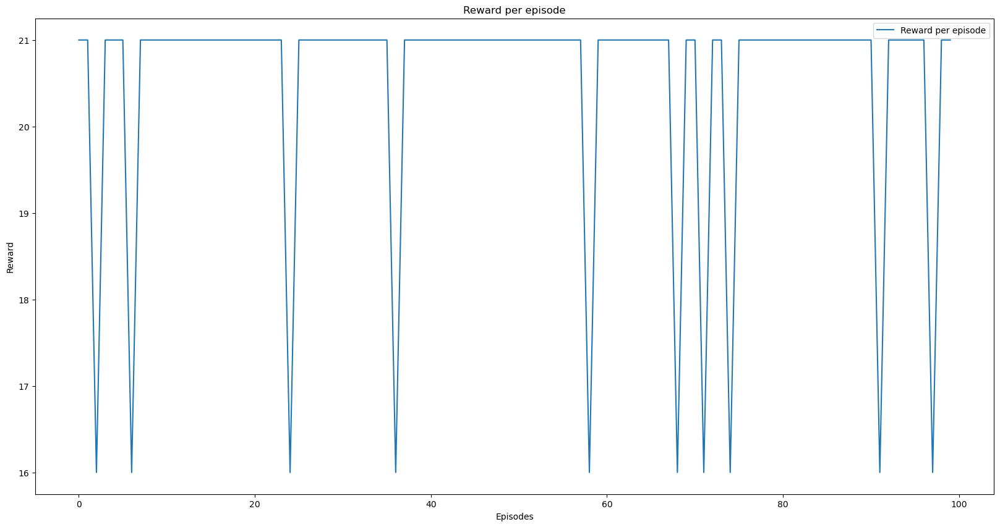

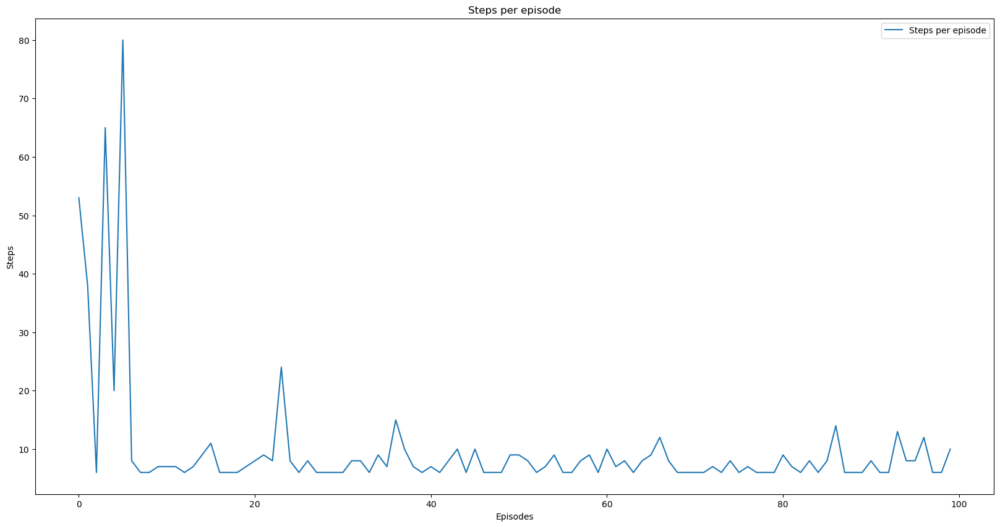

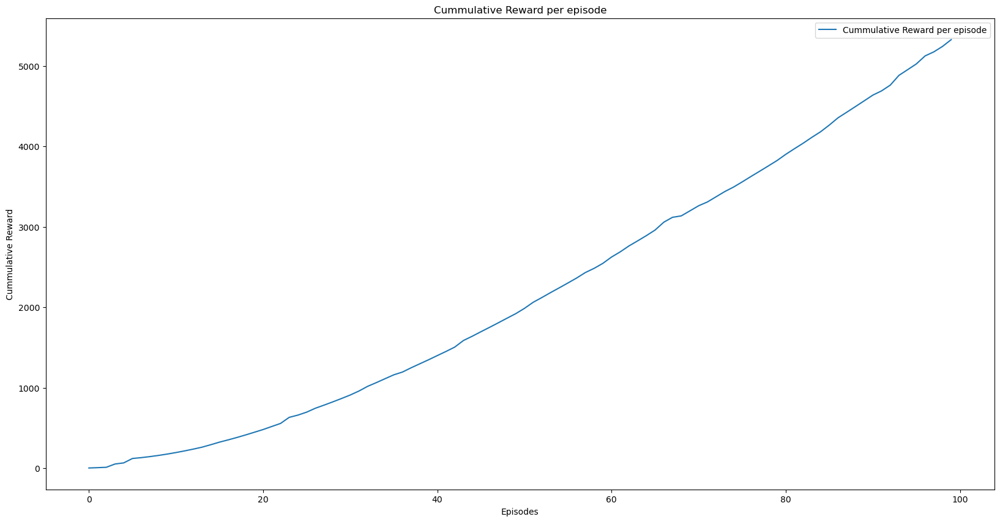

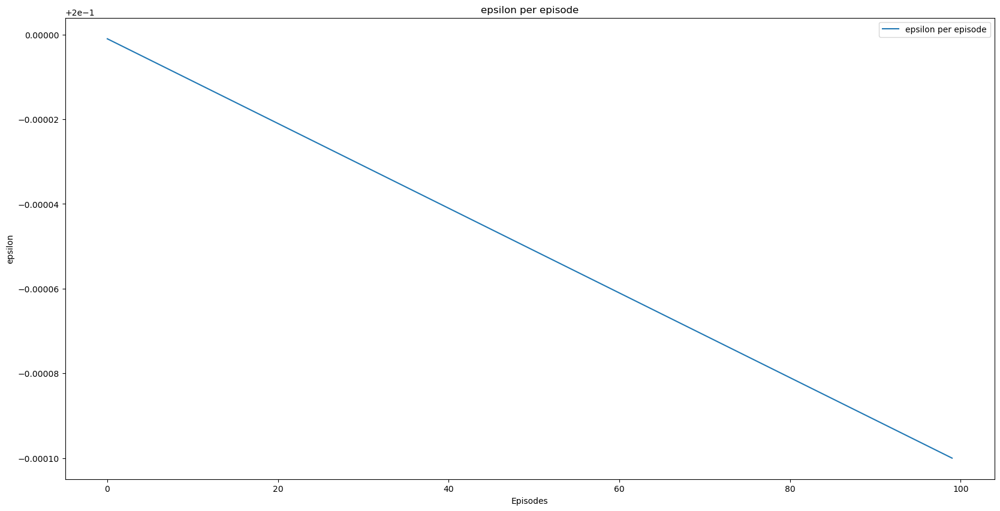

In [40]:
plot_graph(reward_list,episodes,'Reward per episode','Episodes','Reward')
plot_graph(steps_list,episodes,'Steps per episode','Episodes','Steps')
plot_graph(cummulative_list,episodes,'Cummulative Reward per episode','Episodes','Cummulative Reward')
plot_graph(epsilon_list,episodes,'epsilon per episode','Episodes','epsilon')


In [41]:
episodes_list = np.arange(100,2000,100)

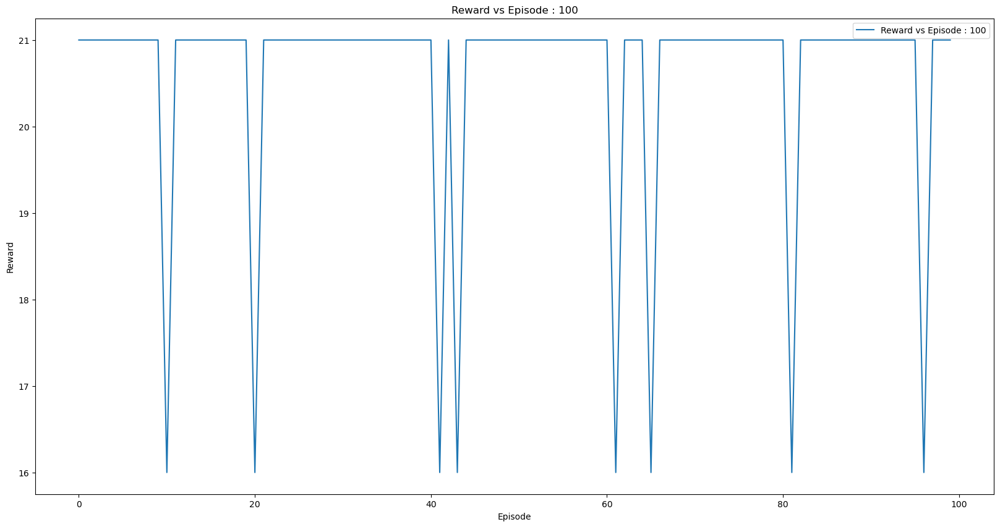

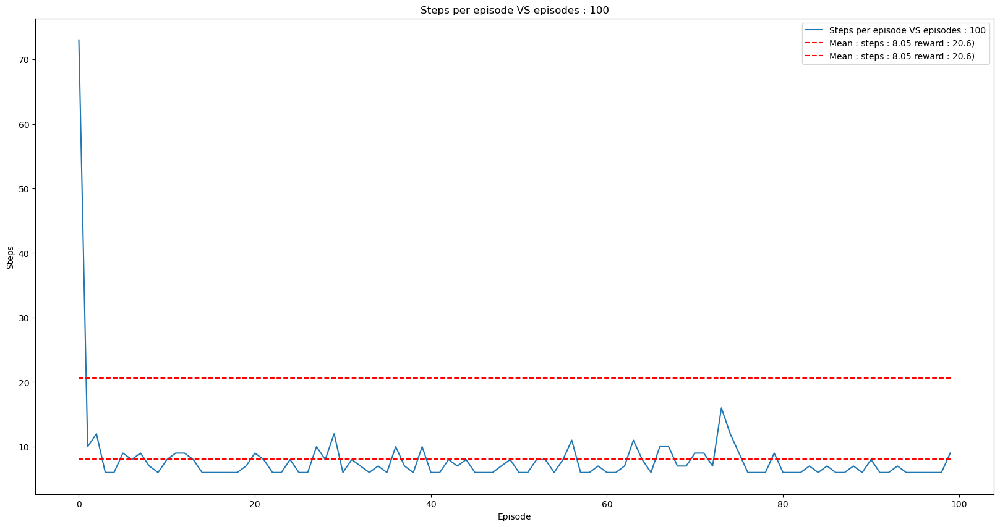

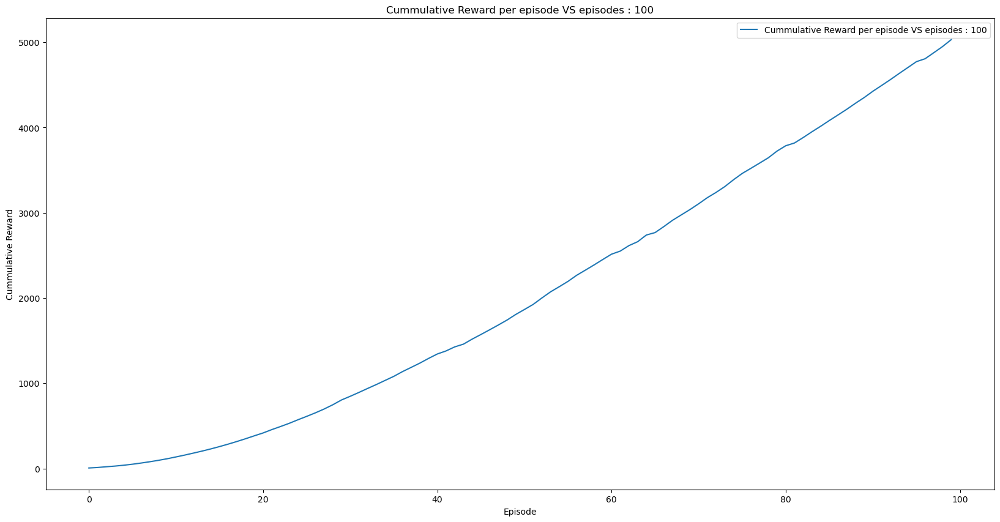

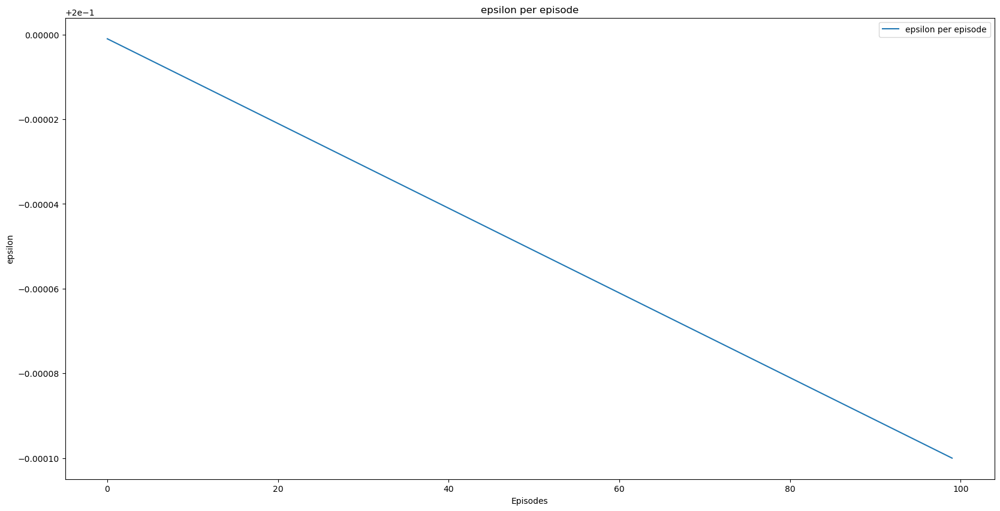

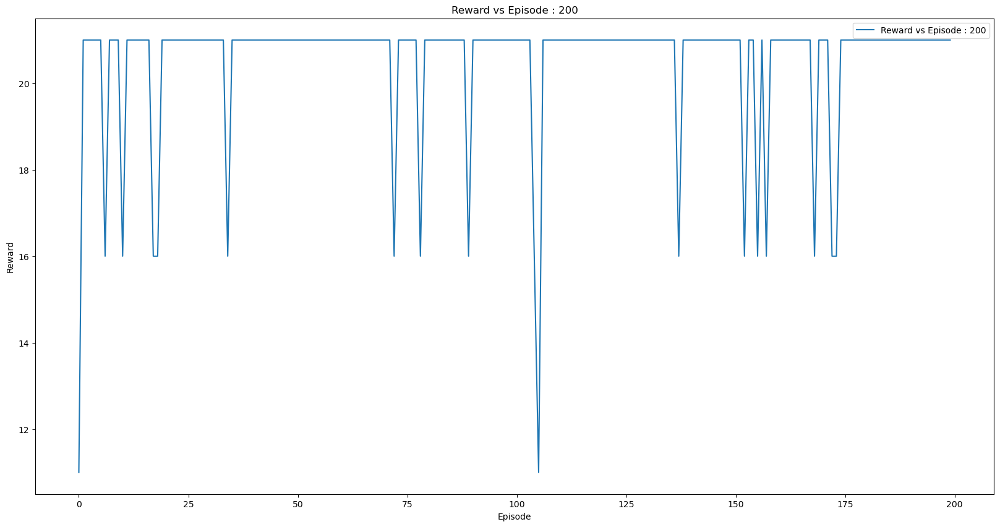

...

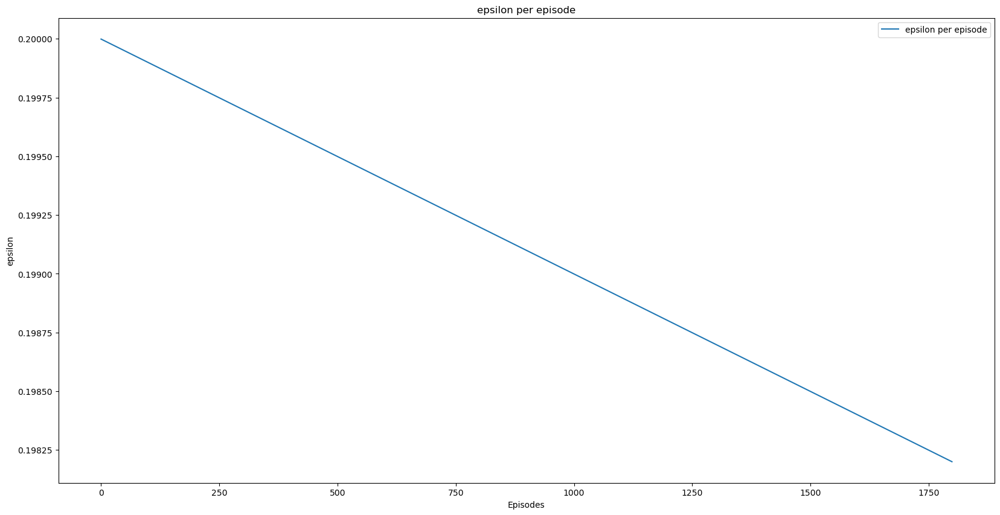

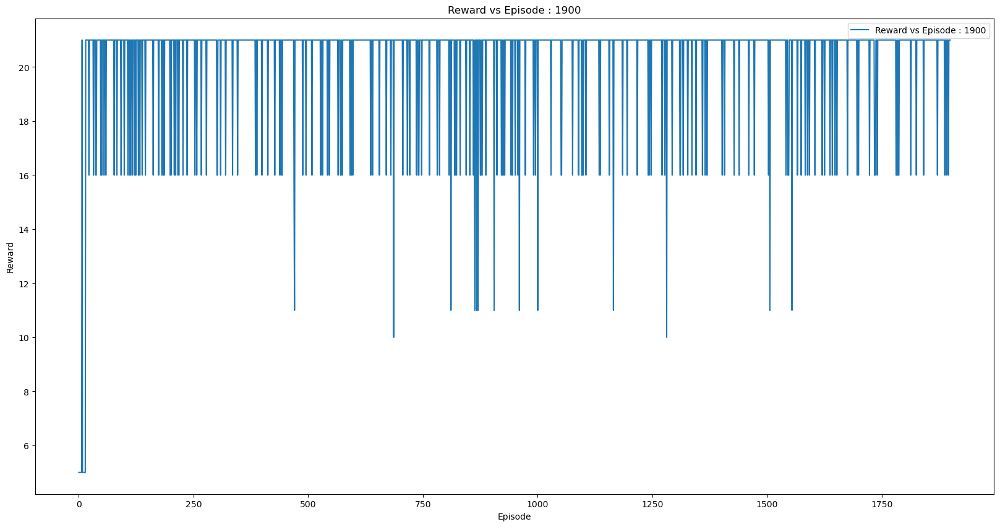

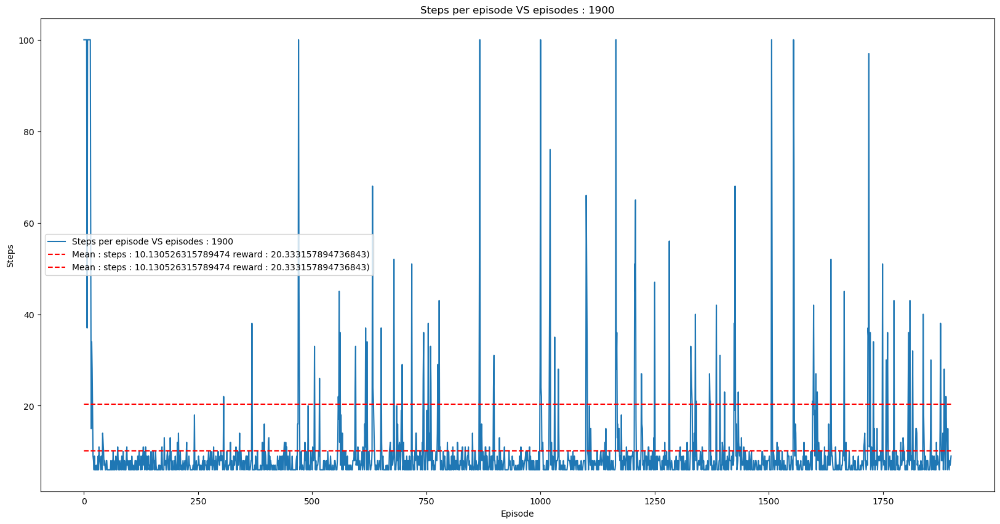

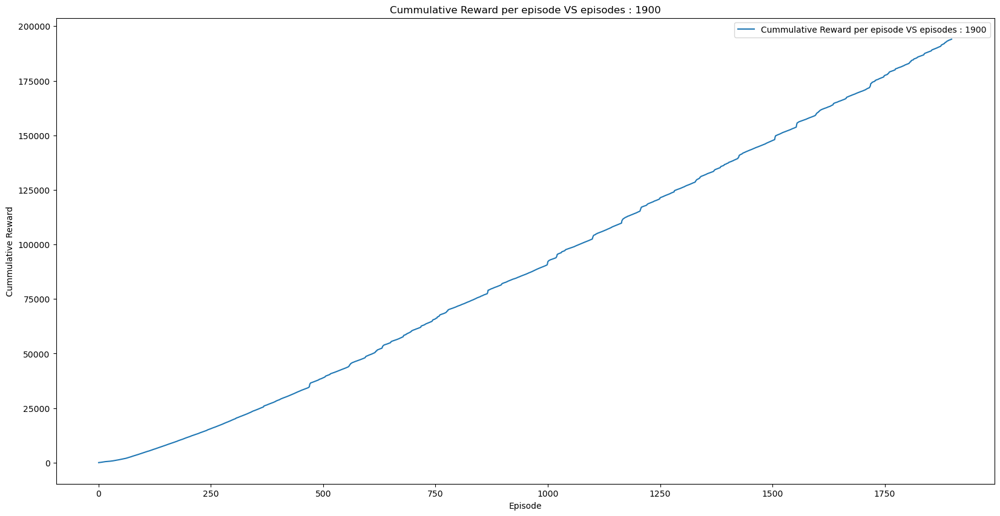

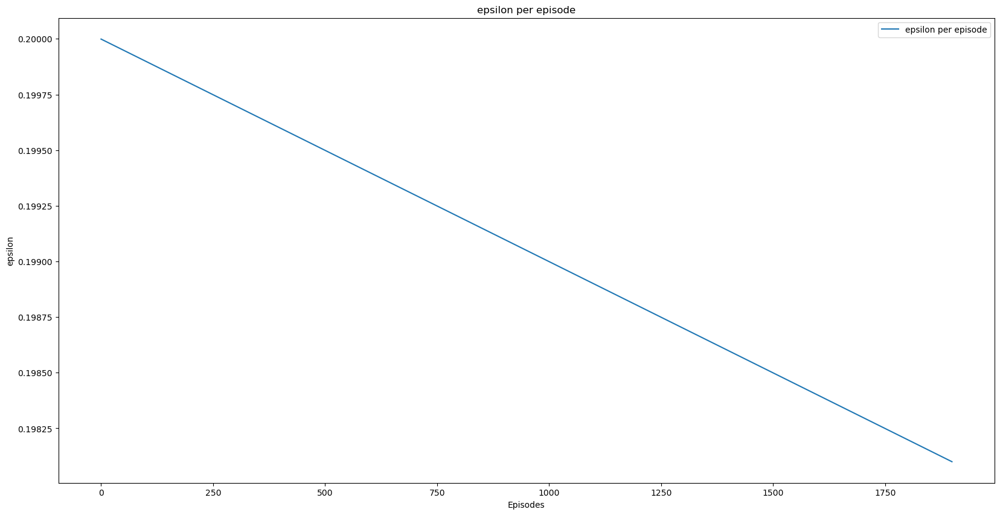

In [42]:
stats = {}
for episodes in episodes_list:
    reward_list,steps_list,cummulative_list, epsilon_list,Q = run_episodes(env2,alpha,gamma,epsilon,episode_count=episodes)
    stats[episodes] = [np.mean(steps_list), np.mean(reward_list)]
    plot_graph(reward_list,episodes,'Reward vs Episode : ' + str(episodes),'Episode' ,'Reward')
    plot_graph(steps_list,episodes,'Steps per episode VS episodes : ' + str(episodes),'Episode','Steps',stats,show_stats=True)
    plot_graph(cummulative_list,episodes,'Cummulative Reward per episode VS episodes : ' + str(episodes),'Episode','Cummulative Reward')
    plot_graph(epsilon_list,episodes,'epsilon per episode','Episodes','epsilon')
    

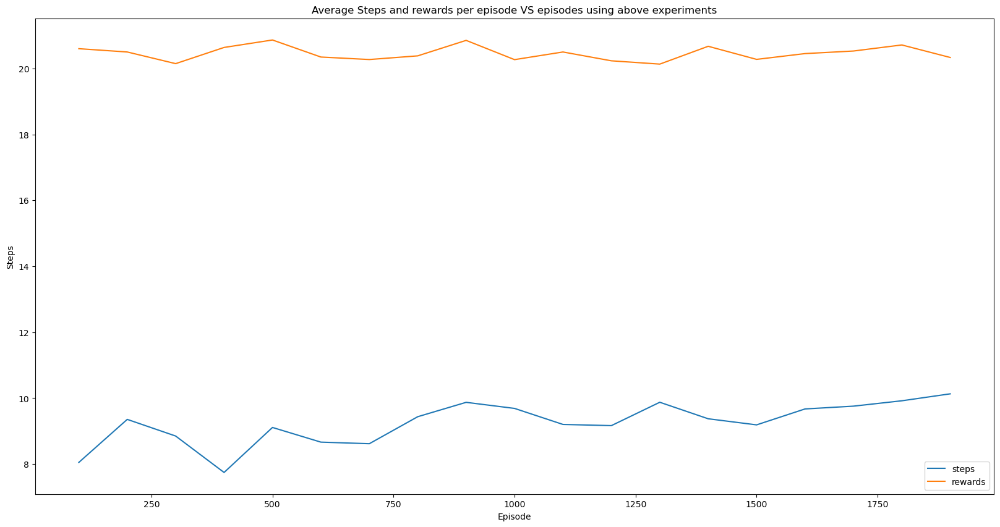

In [43]:
episodes = stats.keys()
steps = [val[0] for val in stats.values()]
rewards = [val[1] for val in stats.values()]
plt.figure(figsize=(20,10))
plt.plot(episodes,steps,label='steps')
plt.plot(episodes,rewards,label='rewards')
plt.legend()
plt.title('Average Steps and rewards per episode VS episodes using above experiments')
plt.xlabel('Episode')
plt.ylabel('Steps')
plt.show()

In [ ]:
import optuna

def objective(trial):
    alpha = trial.suggest_float('alpha', 0, 1)
    gamma = trial.suggest_float('gamma', 0.6, 1)
    epsilon = trial.suggest_float('epsilon', 0.0, 0.4)
    env2.reset()
    reward_list,steps_list,cummulative_list, epsilon_list, Q = run_episodes(env2,alpha,gamma,epsilon,episode_count=200,steps_count=50)
    return np.mean(reward_list)

study = optuna.create_study(storage="sqlite:///hpoola_Assignment3", study_name="Episode-reward_max_episodes_200_steps_50_gamma_6_epsilon_4", direction="maximize", load_if_exists=True)
study.optimize(objective, n_trials=200)

In [ ]:
alpha = 0.11713750290022812
episodes = 200
epsilon = 0.12253351733401509
gamma = 0.9289409987872245
steps = 50

In [ ]:
env2.reset()
reward_list,steps_list, cummulative_list, epsilon_list, Q = run_episodes(env2,alpha,gamma,epsilon,episode_count=episodes,steps_count=steps,render=False)

In [ ]:
plot_graph(reward_list,episodes,'Reward vs Episode','Episode','Reward')
plot_graph(steps_list,episodes,'Steps per episode VS episodes','Episode','Steps')
plot_graph(cummulative_list,episodes,'Cummulative Reward per episode','Episodes','Cummulative Reward')

In [ ]:
for key in Q:
    print(key, Q[key])

## Part-III : Q-Learning ##

In [44]:
env3 = LawnmowerGridWorld(grid_size=4)

In [45]:
env3.reset() # all possible stat

array([[ 5.,  0.,  6., 10.],
       [ 0.,  0.,  0.,  0.],
       [ 0.,  0.,  0., -6.],
       [ 0.,  0., -5.,  0.]])

In [46]:
set_Q = {
    (0, 0): [0, 0, 0, 0],
    (0, 1): [0, 0, 0, 0],
    (0, 2): [0, 0, 0, 0],
    (0, 3): [0, 0, 0, 0],
    (1, 0): [0, 0, 0, 0],
    (1, 1): [0, 0, 0, 0],
    (1, 2): [0, 0, 0, 0],
    (1, 3): [0, 0, 0, 0],
    (2, 0): [0, 0, 0, 0],
    (2, 1): [0, 0, 0, 0],
    (2, 2): [0, 0, 0, 0],
    (2, 3): [0, 0, 0, 0],
    (3, 0): [0, 0, 0, 0],
    (3, 1): [0, 0, 0, 0],
    (3, 2): [0, 0, 0, 0],
    (3, 3): [0, 0, 0, 0],
}

In [47]:
step_size = 0.1
gamma = 0.9
epsilon = 0.2
alpha = 0.1
Q = set_Q

In [48]:
Q

{(0, 0): [0, 0, 0, 0],
 (0, 1): [0, 0, 0, 0],
 (0, 2): [0, 0, 0, 0],
 (0, 3): [0, 0, 0, 0],
 (1, 0): [0, 0, 0, 0],
 (1, 1): [0, 0, 0, 0],
 (1, 2): [0, 0, 0, 0],
 (1, 3): [0, 0, 0, 0],
 (2, 0): [0, 0, 0, 0],
 (2, 1): [0, 0, 0, 0],
 (2, 2): [0, 0, 0, 0],
 (2, 3): [0, 0, 0, 0],
 (3, 0): [0, 0, 0, 0],
 (3, 1): [0, 0, 0, 0],
 (3, 2): [0, 0, 0, 0],
 (3, 3): [0, 0, 0, 0]}

In [49]:
def e_greedy(env,epsilon,Q,pos):
    random_prob = np.random.random()
    if random_prob < epsilon:
        action = env.action_space.sample()
    else:
        action = np.argmax(Q[pos])
    return action


In [50]:
def run_episodes(env2,alpha,gamma,epsilon,episode_count=10,steps_count=100,render=False):
    Q = {
    (0, 0): [0, 0, 0, 0],
    (0, 1): [0, 0, 0, 0],
    (0, 2): [0, 0, 0, 0],
    (0, 3): [0, 0, 0, 0],
    (1, 0): [0, 0, 0, 0],
    (1, 1): [0, 0, 0, 0],
    (1, 2): [0, 0, 0, 0],
    (1, 3): [0, 0, 0, 0],
    (2, 0): [0, 0, 0, 0],
    (2, 1): [0, 0, 0, 0],
    (2, 2): [0, 0, 0, 0],
    (2, 3): [0, 0, 0, 0],
    (3, 0): [0, 0, 0, 0],
    (3, 1): [0, 0, 0, 0],
    (3, 2): [0, 0, 0, 0],
    (3, 3): [0, 0, 0, 0],
}
    reward_list = []
    steps_list = []
    episode_ims = {}
    epsilon_list = []
    cummulative_reward = 0.0
    cummulative_reward_list = []
    epsilon_init = epsilon
    for episode in range(episode_count):
        
        env2.reset()
        if render:
            fig, ax = plt.subplots()
            ims = []
            ax.set_title("Episode " + str(episode))
            ax.grid(True)
            ax.set_yticks(np.arange(0, env2.grid_size, 1))
            ax.set_xticks(np.arange(0, env2.grid_size, 1))
            ax.set_xticklabels(np.arange(0, env2.grid_size, 1), fontsize=12)
            ax.set_yticklabels(np.arange(0, env2.grid_size, 1), fontsize=12)

        states = env2.reset()
        episode_reward = 0.0
        initial_action = e_greedy(env2,epsilon_init,Q,env2.agent_position)
        if render:
            im = ax.imshow(env2.render(),animated=True)
            ims.append([im])
        action = initial_action
        isEnd = False
        count = steps_count
        steps = 0
        states_order = []

        while not isEnd and count > 0:
            count -= 1
            agent_current_pos = env2.agent_position

            next_observation, reward, done, info = env2.step(action)
            if render:
                im = ax.imshow(env2.render(),animated=True)
                ims.append([im])
            
            agent_next_pos = env2.agent_position
            states_order.append(agent_next_pos)
            isEnd = done
            next_action = e_greedy(env2,epsilon_init,Q,agent_next_pos)
            present_q = Q[agent_current_pos][action]
            
            Q[agent_current_pos][action] = present_q + alpha * (reward + gamma * max(Q[agent_next_pos]) - present_q)
            episode_reward += reward
            cummulative_reward += Q[agent_current_pos][action]
            action = next_action
            steps += 1
        steps_list.append(steps)
        reward_list.append(episode_reward)
        cummulative_reward_list.append(cummulative_reward)
        if render:
            ani = animation.ArtistAnimation(fig, ims, interval=500, blit=True,repeat_delay=3000)
            ani.save("task3/Episode_" + str(episode) + ".gif")
            fig.canvas.flush_events()
            observation = env.reset()
        epsilon_init = epsilon_init - 1e-6
        epsilon_list.append(epsilon_init)
        plt.close()
    return reward_list,steps_list,cummulative_reward_list,epsilon_list,Q




In [51]:
episodes = 100

In [52]:
reward_list_ql, steps_list_ql, cummulative_list_ql, epsilon_list_ql, Q_ql = run_episodes(env3,alpha,gamma,epsilon,episodes,100,True)

MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailab

In [54]:
for key in Q_ql:
    print(key, Q_ql[key])

(0, 0) [3.4484791808255766, 5.242568256095207, 3.861981383840849, 13.19076710422971]
(0, 1) [6.148793393208235, 3.3308478840072127, 4.396222176323604, 14.769459639541234]
(0, 2) [3.311543682966982, 0.9804899364806408, 5.228063093889715, 9.999704873345692]
(0, 3) [0, 0, 0, 0]
(1, 0) [16.459427064379145, 4.262367085217929, 4.498652799983745, 1.4737874539706721]
(1, 1) [9.506480089119572, 0, 2.0864550748269206, 0]
(1, 2) [4.70380395381843, 0, 0, 0.0]
(1, 3) [1.0, 0, 0, 0]
(2, 0) [14.858023028776682, 4.270147262630372, 0.19251977122125954, 0.30427559563979084]
(2, 1) [2.2464442251427297, 0, 1.339459182545139, 0.0]
(2, 2) [0.3203880131166476, 0, 0, 0]
(2, 3) [0, 0, 0, 0]
(3, 0) [13.140243844093042, 2.599520190474478, 3.1395891472713964, 0.021133270831085845]
(3, 1) [0.37172071678216145, 0.02103920577408585, 0, 0]
(3, 2) [0, 0, 0, 0]
(3, 3) [0, 0, 0, 0]


In [55]:
def plot_graph(y_data,episodes, title, xlabel, ylabel,stats={},show_stats=False):
    x_data = np.arange(0,episodes,1)
    plt.figure(figsize=(20,10))
    plt.plot(x_data,y_data,label=title,)
    if show_stats:
        plt.plot(x_data,[stats[episodes] for x in x_data],color='red',linestyle='dashed',label='Mean : ' + f"steps : {stats[episodes][0]} reward : {stats[episodes][1]})")
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()
    plt.show()
    

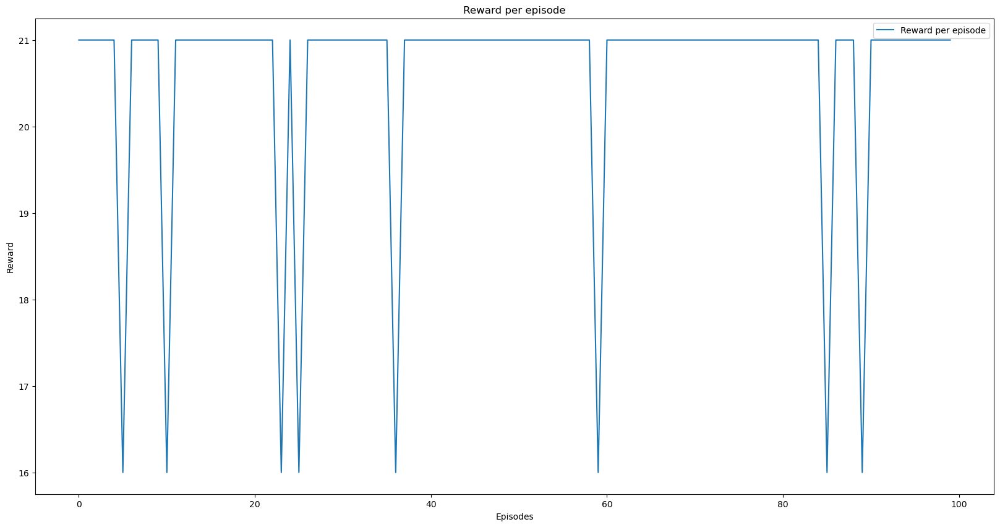

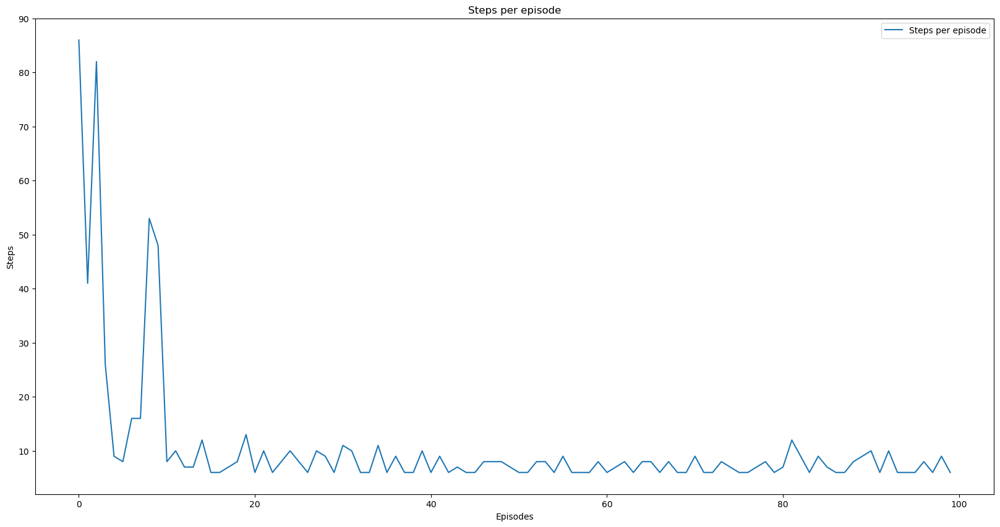

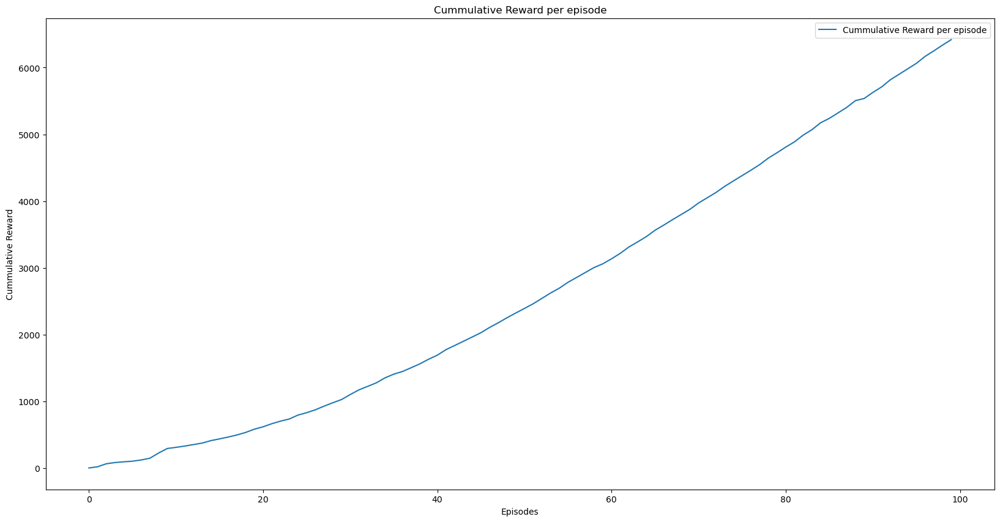

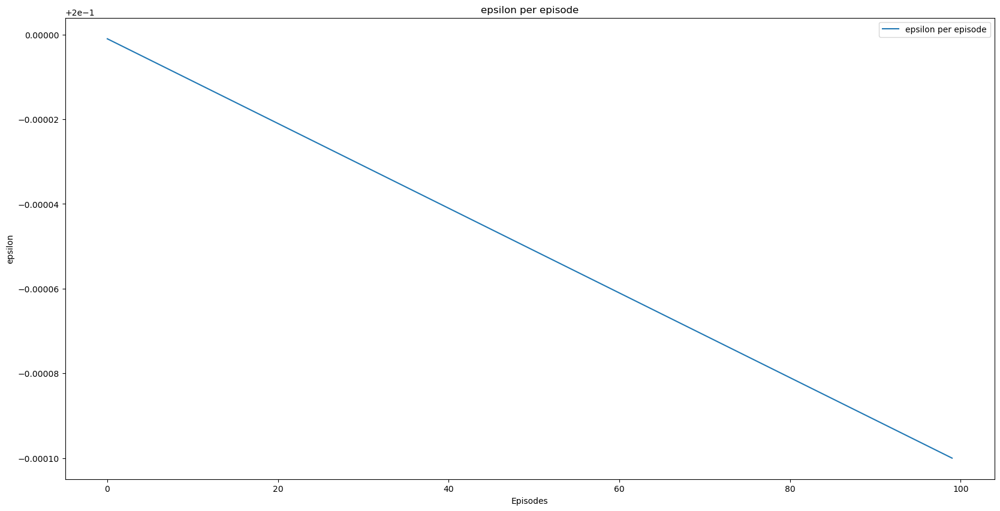

In [56]:
plot_graph(reward_list_ql,episodes,'Reward per episode','Episodes','Reward')
plot_graph(steps_list_ql,episodes,'Steps per episode','Episodes','Steps')
plot_graph(cummulative_list_ql,episodes,'Cummulative Reward per episode','Episodes','Cummulative Reward')
plot_graph(epsilon_list_ql,episodes,'epsilon per episode','Episodes','epsilon')


In [57]:
episodes_list = np.arange(100,2000,100)

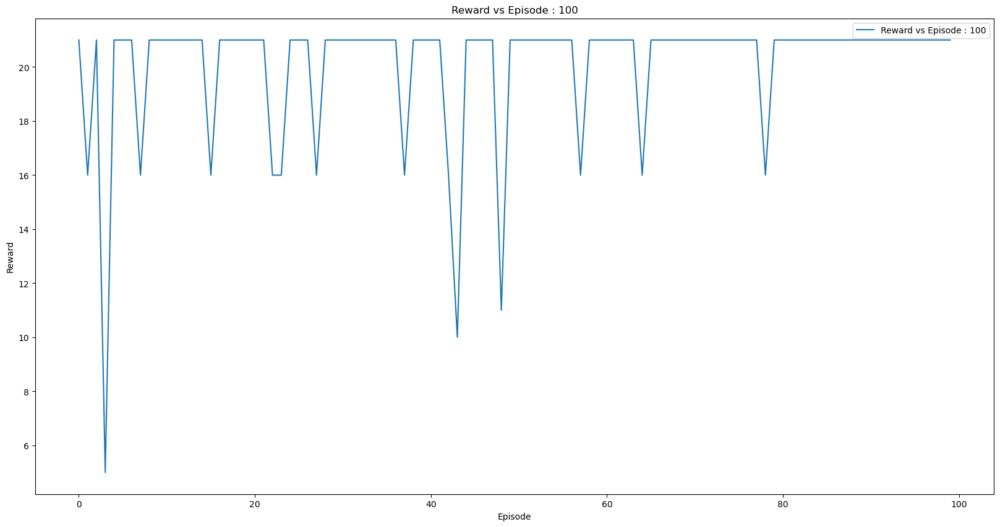

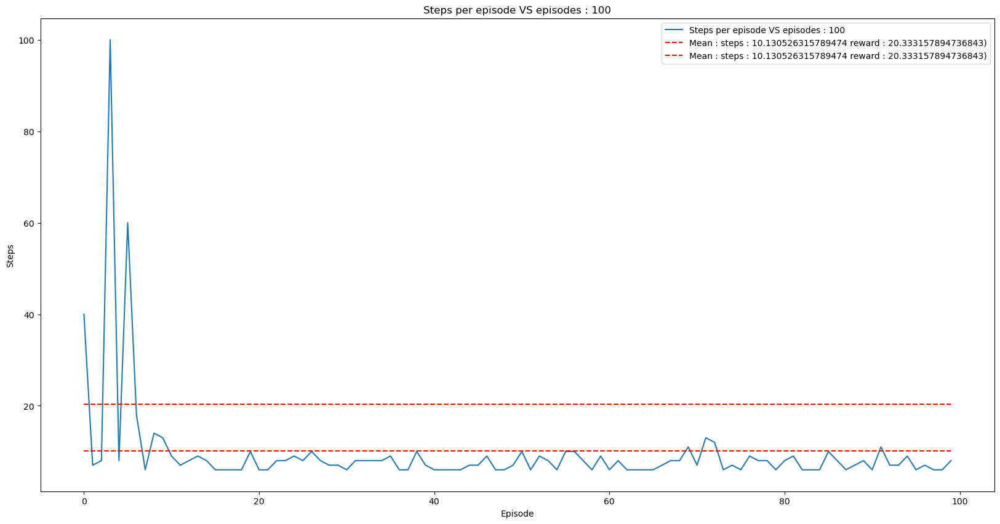

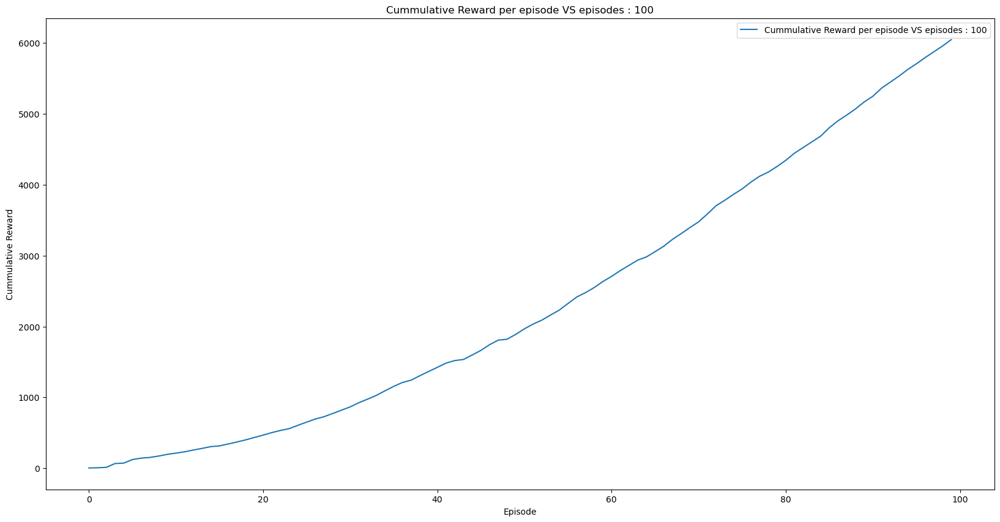

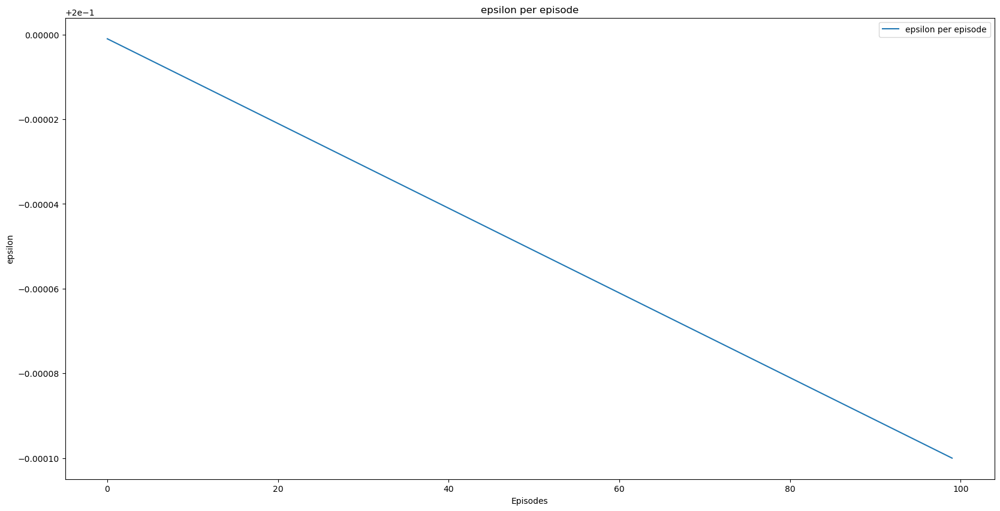

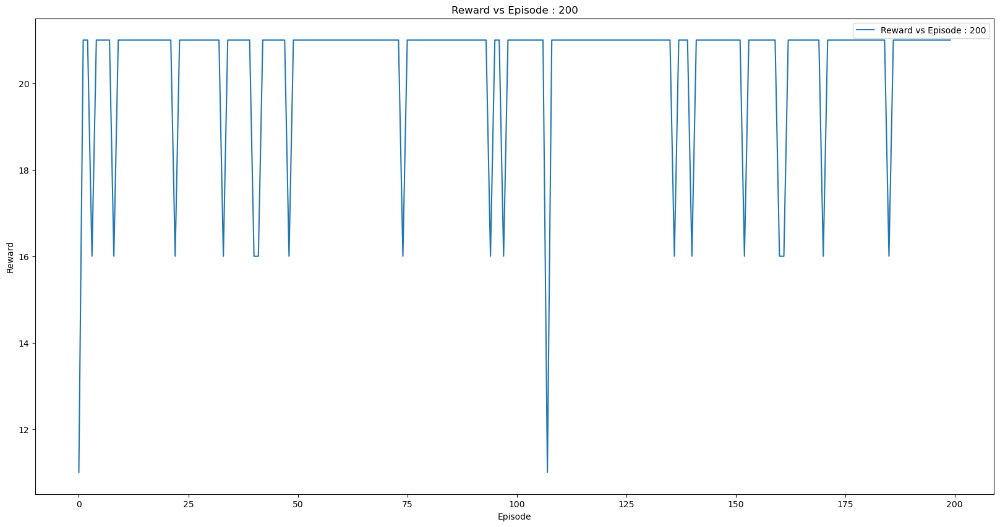

...

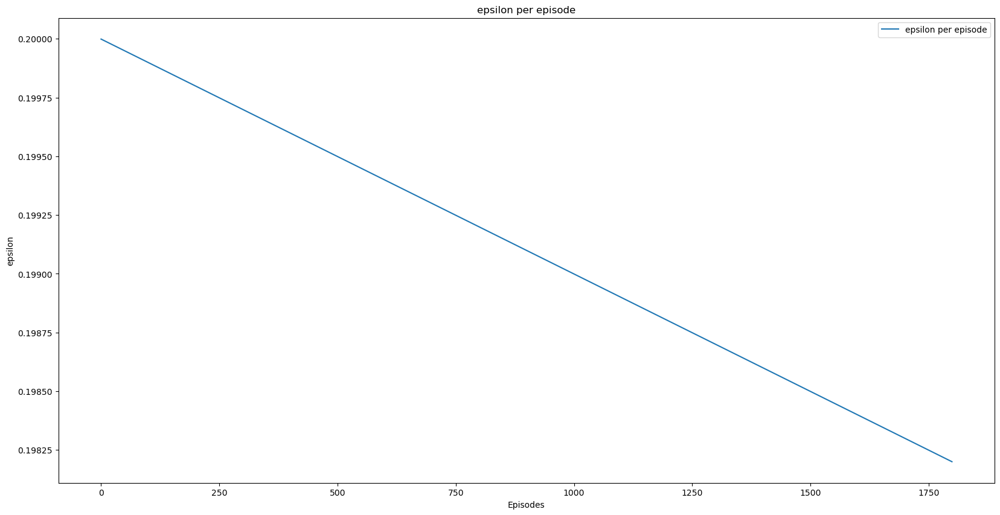

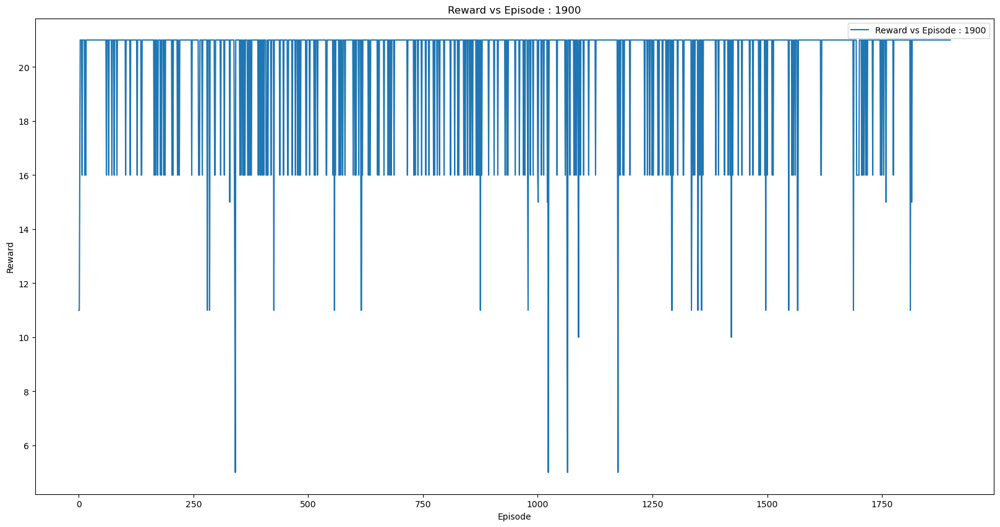

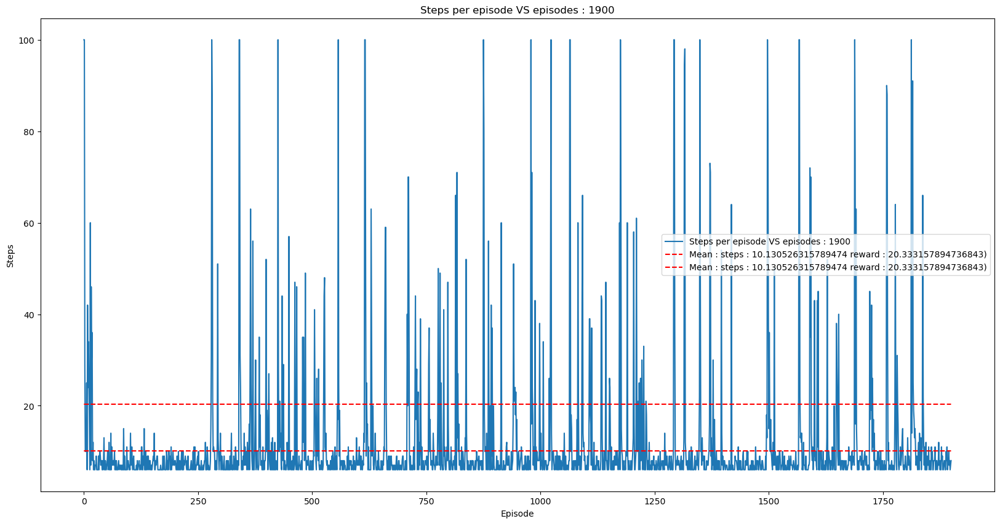

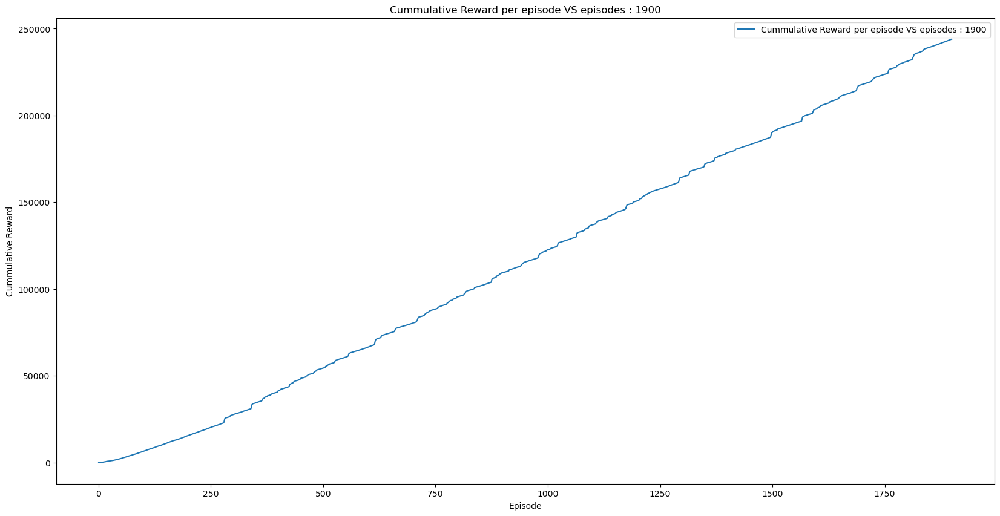

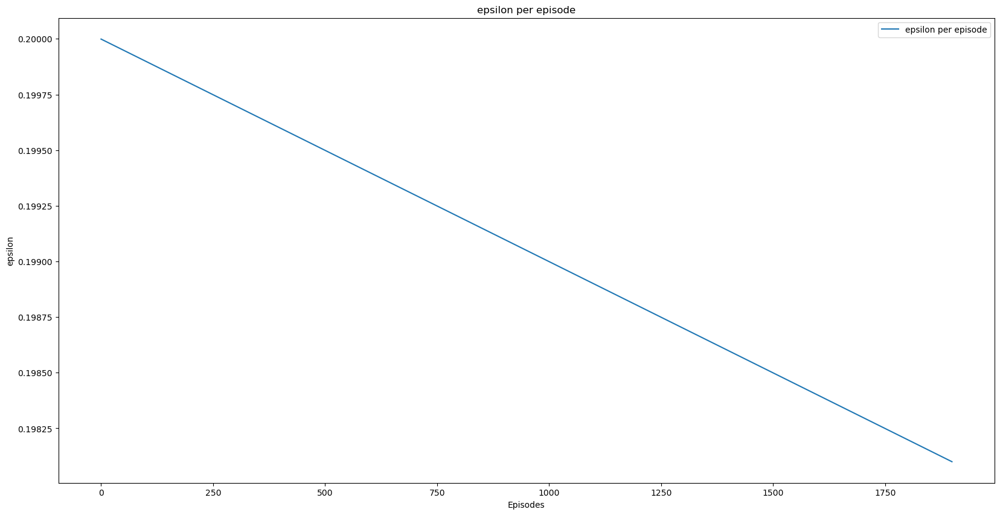

In [58]:
stats2 = {}
for episodes in episodes_list:
    reward_list_ql,steps_list_ql,cummulative_list_ql, epsilon_list_ql,Q_ql = run_episodes(env3,alpha,gamma,epsilon,episode_count=episodes)
    stats2[episodes] = [np.mean(steps_list), np.mean(reward_list)]
    plot_graph(reward_list_ql,episodes,'Reward vs Episode : ' + str(episodes),'Episode' ,'Reward')
    plot_graph(steps_list_ql,episodes,'Steps per episode VS episodes : ' + str(episodes),'Episode','Steps',stats2,show_stats=True)
    plot_graph(cummulative_list_ql,episodes,'Cummulative Reward per episode VS episodes : ' + str(episodes),'Episode','Cummulative Reward')
    plot_graph(epsilon_list_ql,episodes,'epsilon per episode','Episodes','epsilon')
    

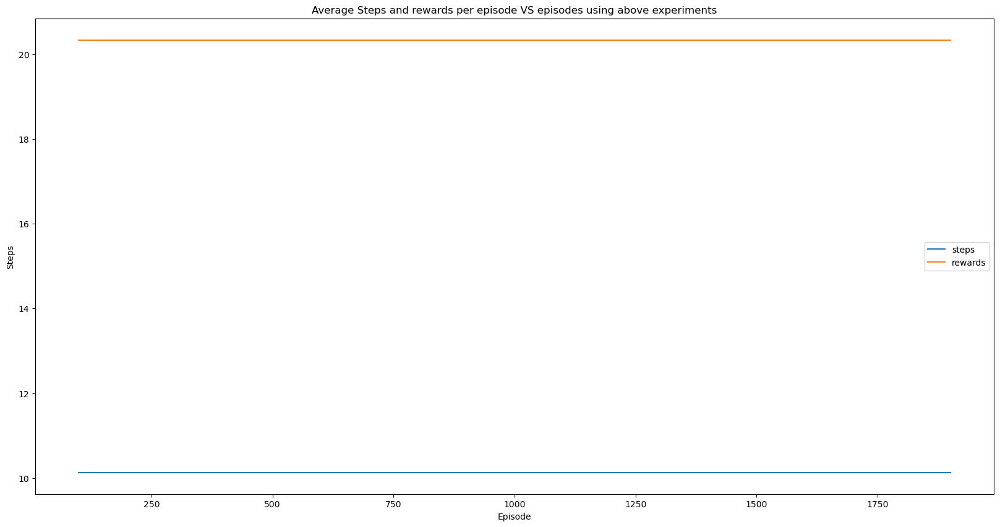

In [59]:
episodes = stats2.keys()
steps = [val[0] for val in stats2.values()]
rewards = [val[1] for val in stats2.values()]
plt.figure(figsize=(20,10))
plt.plot(episodes,steps,label='steps')
plt.plot(episodes,rewards,label='rewards')
plt.legend()
plt.title('Average Steps and rewards per episode VS episodes using above experiments')
plt.xlabel('Episode')
plt.ylabel('Steps')
plt.show()

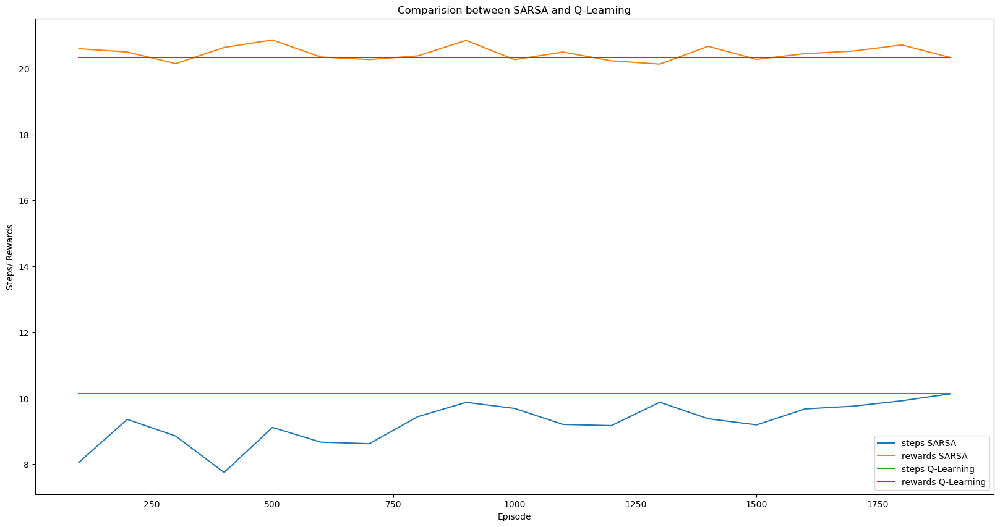

In [60]:
# comparision graph between SARSA and Q-Learning
episodes = stats.keys()
steps_sarsa = [val[0] for val in stats.values()]
rewards_sarsa = [val[1] for val in stats.values()]

steps_ql = [val[0] for val in stats2.values()]
rewards_ql = [val[1] for val in stats2.values()]

plt.figure(figsize=(20,10))

plt.plot(episodes,steps_sarsa,label='steps SARSA')
plt.plot(episodes,rewards_sarsa,label='rewards SARSA')

plt.plot(episodes,steps_ql,label='steps Q-Learning')
plt.plot(episodes,rewards_ql,label='rewards Q-Learning')

plt.legend()
plt.title('Comparision between SARSA and Q-Learning')
plt.xlabel('Episode')
plt.ylabel('Steps/ Rewards')
plt.show()

In [62]:
import optuna
def objective(trial):
    alpha = trial.suggest_float('alpha', 0, 1)
    gamma = trial.suggest_float('gamma', 0.6, 1)
    epsilon = trial.suggest_float('epsilon', 0.0, 0.4)
    env3.reset()
    reward_list,steps_list,cummulative_list, epsilon_list, Q = run_episodes(env3,alpha,gamma,epsilon,episode_count=200,steps_count=50)
    return np.mean(reward_list)

study = optuna.create_study(storage="sqlite:///hpoola_Assignment3", study_name="Episode-ql_reward_max_episodes_200_steps_50_gamma_6_epsilon_4", direction="maximize", load_if_exists=True)
study.optimize(objective, n_trials=200)

[I 2023-05-11 14:08:30,309] A new study created in RDB with name: Episode-ql_reward_max_episodes_200_steps_50_gamma_6_epsilon_4
[I 2023-05-11 14:08:30,391] Trial 0 finished with value: 18.575 and parameters: {'alpha': 0.002187127213348128, 'gamma': 0.711462412523587, 'epsilon': 0.19180942331136341}. Best is trial 0 with value: 18.575.
[I 2023-05-11 14:08:30,426] Trial 1 finished with value: 19.87 and parameters: {'alpha': 0.09988930197556312, 'gamma': 0.7952127593961363, 'epsilon': 0.2785685224892999}. Best is trial 1 with value: 19.87.
[I 2023-05-11 14:08:30,493] Trial 2 finished with value: 12.745 and parameters: {'alpha': 0.9393114736754677, 'gamma': 0.9795935751727703, 'epsilon': 0.16495490113611366}. Best is trial 1 with value: 19.87.
[I 2023-05-11 14:08:30,563] Trial 3 finished with value: 11.16 and parameters: {'alpha': 0.9822404403026912, 'gamma': 0.9832515549450982, 'epsilon': 0.28988404811113305}. Best is trial 1 with value: 19.87.
[I 2023-05-11 14:08:30,599] Trial 4 finished

In [63]:
alpha = 0.0015656820648213832
episodes = 200
epsilon = 0.19661118556986412
gamma = 0.8486582251694117
steps = 50

In [64]:
env3.reset()
reward_list_ql,steps_list_ql, cummulative_list_ql, epsilon_list_ql, Q_ql = run_episodes(env3,alpha,gamma,epsilon,episode_count=episodes,steps_count=steps,render=False)

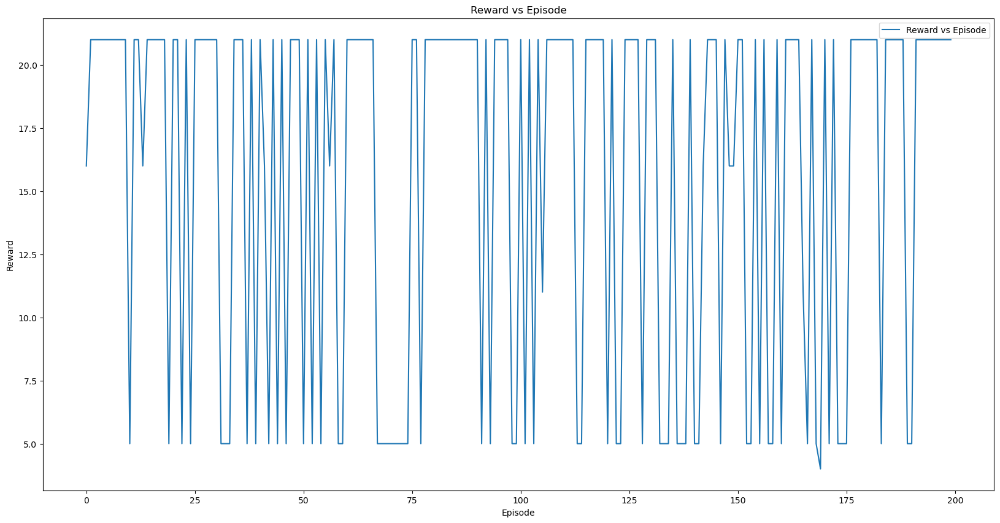

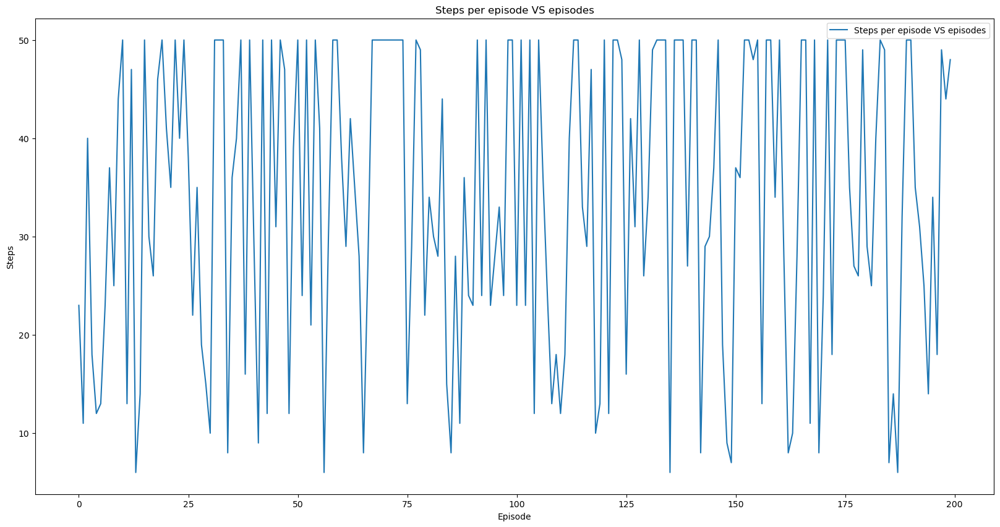

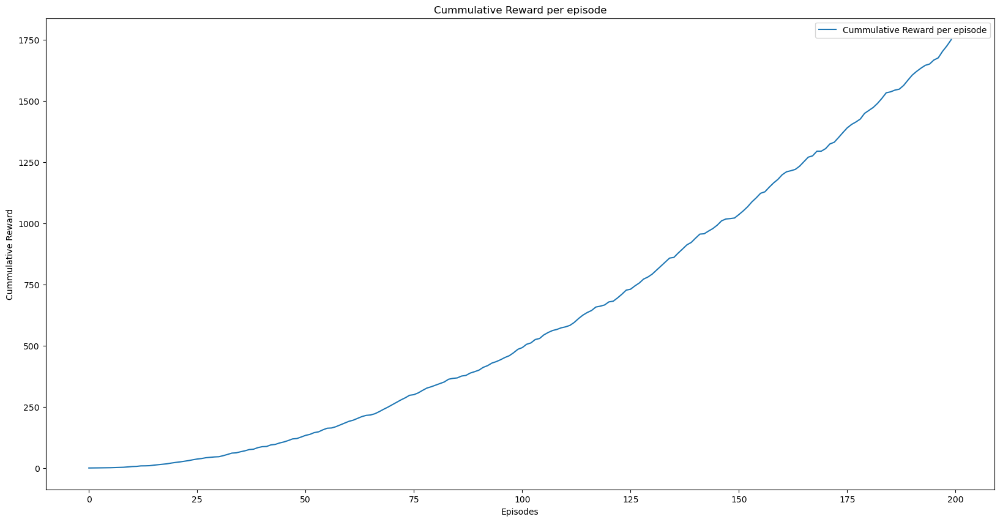

In [65]:
plot_graph(reward_list_ql,episodes,'Reward vs Episode','Episode','Reward')
plot_graph(steps_list_ql,episodes,'Steps per episode VS episodes','Episode','Steps')
plot_graph(cummulative_list_ql,episodes,'Cummulative Reward per episode','Episodes','Cummulative Reward')

In [66]:
for key in Q_ql:
    print(key, Q_ql[key])

(0, 0) [0.03767740821821158, 0.4497444006857124, 0.0364927094336898, 0.103026306159303]
(0, 1) [0.005899045038525339, 0.00013019481191098872, 0.0013288043340788096, 1.2758136799344983]
(0, 2) [0.003988201810342678, 0.0003996974278306637, 0.008204641360234481, 1.9065719985348788]
(0, 3) [0, 0, 0, 0]
(1, 0) [0.6670959115633304, 0.011770433792190697, 0.07175693973373688, 0.0035123030999639777]
(1, 1) [0.00929886476698641, 1.8381657798581243e-06, 0.059781689972079964, 6.0869871289616643e-05]
(1, 2) [0.07573158638490406, 2.2693850254407053e-07, 0, 0]
(1, 3) [0.01565682064821383, 0, 0, 0]
(2, 0) [0.1519536956365677, 0.00022236249510870765, 0.0016494054505908637, 1.8821138318867405e-05]
(2, 1) [9.95071047140896e-05, 1.6366596326563625e-10, 0.0018821200750454249, 4.94526223645818e-07]
(2, 2) [0.00025030140836531756, 0, 0, -0.009394092388928299]
(2, 3) [0.0, 0, 0, 0]
(3, 0) [0.01589959312889941, 5.804175175162888e-05, 2.4262032924274227e-05, 4.282471826788753e-08]
(3, 1) [6.252887207010443e-06,